<img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% >

# <center> Assignment 1: Photometric Stereo & Colour </center>
<center> Computer Vision 1 University of Amsterdam </center>
    <center> Due 23:59 PM, September 17, 2022 (Amsterdam time) </center>
    
***

## General guidelines
Your code and discussion must be submitted through this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. For full credit, make sure your answer follows these guidelines:
- Please express your thoughts concisely. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make your notebook self-contained and complete.
- Analyze your results and discuss them, e.g. why algorithm A works better than algorithm B in a certain problem.
- Tables and figures must be accompanied by a brief description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.
Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations.

## 0 Environment Set Up

You are allowed to use **only** the following library versions:
- python=3.10.4
- matplotlib==3.5.3
- matplotlib-inline==0.1.6
- numpy==1.23.2
- opencv-python==4.6.0.66

Using functions that are not working in these versions could lead to grade deduction.

## 1 Photometric Stereo (50pts)

In this part of the assignment, you are going to implement the photometric stereo algorithm as described in Section 5.4 (Forsyth and Ponce, *Computer Vision: A Modern Approach*). The chapter snippet can be found in the course materials.

Following this instruction, you will have to edit and fill in your code in the functions **estimate_alb_nrm**, **check_integrability**, and **construct_surface**. The main function **photometric_stereo** is provided for reference and should not be taken as is. Throughout the assignment, you will be asked to perform different trials and experiments which will require you to adjust the main code accordingly, this also shows how well you can cope with the materials.

Include images of the results into this notebook. For 3D models, make sure to choose a viewpoint that makes the structure as clear as possible and/or feel free to take them from multiple viewpoints.

### 1.1 Estimating Albedo and Surface Normal (15pts)
Let us start with the grayscale sphere model, which is located in the SphereGray5 folder. The folder contains 5 images of a sphere with grayscale checker texture under similar lighting conditions with the one in the book. Your task is to estimate the surface reflectance (albedo) and surface normal of this model. The light source directions are encoded in the image file names.

1. Complete the code for function **estimate_alb_nrm()** to estimate albedo and surface normal map for the SphereGray5 folder. What do you expect to see in albedo image and how is it different with your result?
2. In principle, what is the minimum number of images you need to estimate albedo and surface normal? Run the algorithm with more images by using SphereGray25 and observe the differences in the results. You could try all images at once or a few at the time, in an incremental fashion. Choose a strategy and justify it by discussing your results.
3. What is the impact of shadows in photometric stereo? Explain the trick that is used in the text to deal with shadows. Remove that trick and check your results. Is the trick necessary in the case of 5 images, how about 25 images?

**Hint**: To get the least-squares solution of a linear system, you can use **numpy.linalg.lstsq** function.

<span style="color:red"> Answer: </span> 

(1) We would expect to see consistent values of albedo in each partitions without any "shadowing" that gives a 3D visual effect. However, the actual albedo map more resembles the sphere captured from the front with parallel light source from this direction. 

(2) In principle, minimum number of images is 4, as this provides a measurement of errors when estimating the normals. When using more images, theoretically, the results would better resemble the reality, as more measurements usually reduce the errors in estimating the normals when using the least square method. However, when using the gray sphere model, the difference of the normals and albedo is visually harder to observe even if we increase the number of pictures drastically from 5 to 25. This is possibly because the object's surface is not very complex. 

(3) The reconstruction of the surface normals will not be accurate if substantial regions of the surface are in shadow for too many light sources, this is because there is no measurement of light intensity in the shadowed areas (the measurement will always be zero). So in the linear system for solving the normals, the error for the shadowed regions would be larger if many equations (that representing light from different angles) all equal to zero. The shadow trick we use is to exclude the equations in the shadow from the linear system. Because the light intensity equals zero, by multiplying its zero light intensity with the corresponding entry in the diagonal matrix, the equation in shadows for this pixel becomes 0 = 0, which will not be considered when estimating using least square solution.

For the gray sphere, it seems whether using the shadow trick is not relavant, as the result of the normals and albedo do not vary visually obviously. However, when using only 5 images, it is more useful to add the shadowtrick because the linear system is smaller, any zero equations would have more weight on the result. However, for 25 images, it is less important to use shadow trick, because the areas that are always in shadow for many light sources in this case are very limited, so the errors of the results would not be too large. 



In [1]:
# First some utils we need
import os
import numpy as np
import glob
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def load_syn_images(image_dir='./SphereGray5/', channel=0):
    files = os.listdir(image_dir)
    #files = [os.path.join(image_dir, f) for f in files]
    nfiles = len(files)
    
    image_stack = None
    V = 0
    Z = 0.5
    
    for i in range(nfiles):
        # read input image
        im = cv2.imread(os.path.join(image_dir, files[i]))
        im = im[:,:,channel]
        
        # stack at third dimension
        if image_stack is None:
            h, w = im.shape
            print('Image size (H*W): %d*%d' %(h,w) )
            image_stack = np.zeros([h, w, nfiles], dtype=int)
            V = np.zeros([nfiles, 3], dtype=np.float64)
            
        image_stack[:,:,i] = im
        
        # read light direction from image name
        X = np.double(files[i][(files[i].find('_')+1):files[i].rfind('_')])
        Y = np.double(files[i][files[i].rfind('_')+1:files[i].rfind('.png')])
        V[i, :] = [-X, Y, Z]
        
    # normalization
    image_stack = np.double(image_stack)
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    if (max_val-min_val != 0):
        image_stack = (image_stack - min_val) / (max_val - min_val)
    normV = np.tile(np.sqrt(np.sum(V ** 2, axis=1, keepdims=True)), (1, V.shape[1]))
    scriptV = V / normV
    
    return image_stack, scriptV
    
    
def load_face_images(image_dir='./yaleB02/'):
    num_images = 64
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    h, w = ambient_image.shape

    # get list of all other image files
    import glob 
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image


    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    scriptV = np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val)
    
    return image_stack, scriptV


def load_apple_images(image_dir='./Apples_png/'):
    num_images = 100
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    h, w = try_image[:,:,0].shape

    # get list of all other image files
    import glob 
    d = glob.glob(os.path.join(image_dir, 'I_0*.png'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = []
    for i in filenames:
        filenames_idx.append(int(i.split('_')[1].split('.')[0]))

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,0]
        
    with open('./images/photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    scriptV = np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val)
    
    return image_stack, scriptV
    
    
def show_results(albedo, normals, height_map, SE):
    # Stride in the plot, you may want to adjust it to different images
    stride = 1
    
    # showing albedo map
    fig = plt.figure()
    albedo_max = albedo.max()
    albedo_max = 1
    albedo = albedo / albedo_max
    print(albedo.shape)
    plt.imshow(albedo, cmap="gray")
    plt.show()
    
    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])
    plt.show()
    
    # meshgrid
    X, Y, _ = np.meshgrid(np.arange(0,np.shape(normals)[0], stride),
    np.arange(0,np.shape(normals)[1], stride),
    np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]
    
    '''
    =============
    You could further inspect the shape of the objects and normal directions by using plt.quiver() function.  
    =============
    '''
    
    # plotting the SE
    H = SE[::stride,::stride]
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot_surface(X,Y, H.T)
    plt.show()
    
    # plotting model geometry
    H = height_map[::stride,::stride]
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot_surface(X,Y, H.T)
    plt.show()



In [2]:
def estimate_alb_nrm(image_stack, scriptV, shadow_trick=True):
    
    # COMPUTE_SURFACE_GRADIENT compute the gradient of the surface
    # INPUT:
    # image_stack : the images of the desired surface stacked up on the 3rd dimension
    # scriptV : matrix V (in the algorithm) of source and camera information
    # shadow_trick: (true/false) whether or not to use shadow trick in solving linear equations
    # OUTPUT:
    # albedo : the surface albedo
    # normal : the surface normal

    h, w, _ = image_stack.shape
    
    # create arrays for 
    # albedo (1 channel)
    # normal (3 channels)
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    """
    ================
    Your code here
    ================
    for each point in the image array
        stack image values into a vector i
        construct the diagonal matrix scriptI
        solve scriptI * scriptV * g = scriptI * i to obtain g for this point
        albedo at this point is |g|
        normal at this point is g / |g|
    """

    for y in range(h): 
        for x in range(w): 
            i = image_stack[y][x]
            if shadow_trick == True:
                scriptI = np.diag(i)
                i = i.reshape(image_stack.shape[2], 1)
                normal_point = np.linalg.lstsq(scriptI@scriptV, scriptI@i, rcond=None)[0] # solve the LS problem
            else:
                i = i.reshape(image_stack.shape[2], 1)
                normal_point = np.linalg.lstsq(scriptV, i, rcond=None)[0] # solve the LS problem
            normal_point = np.array([row[0] for row in normal_point]) # convert vector in row form
            albedo_point = np.linalg.norm(normal_point)
            if albedo_point != 0:
                normal_point = normal_point/albedo_point # normalize non-zero vectors
            albedo[y][x] = albedo_point
            normal[y][x] = normal_point 

    return albedo, normal
    
# if __name__ == '__main__':
#     n = 5
#     image_stack = np.zeros([10,10,n])
#     scriptV = np.zeros([n,3])
#     estimate_alb_nrm( image_stack, scriptV, shadow_trick=True)

In [3]:
def show_results_albedo_normals(albedo, normals):    
    # showing albedo map
    fig = plt.figure()
    albedo_max = albedo.max()
    albedo_max = 1
    albedo = albedo / albedo_max
    print(albedo.shape)
    plt.imshow(albedo, cmap="gray")
    plt.show()
    
    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])
    plt.show()
    

Loading images...

Image size (H*W): 512*512
Finish loading 5 images.

Computing surface albedo and normal map...

(512, 512)


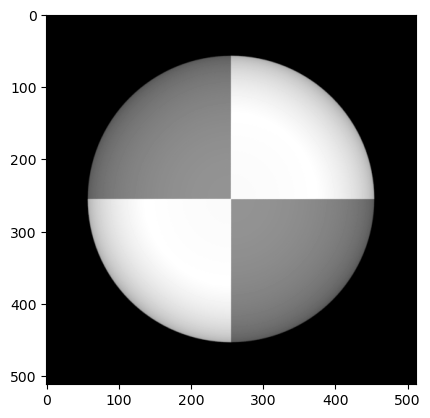

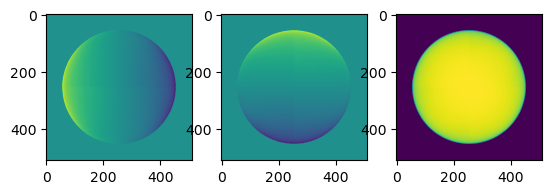

In [4]:
image_dir='./images/photometrics_images/SphereGray5/'
# obtain many images in a fixed view under different illumination
print('Loading images...\n')
[image_stack, scriptV] = load_syn_images(image_dir)
[h, w, n] = image_stack.shape
print('Finish loading %d images.\n' % n)
# compute the surface gradient from the stack of imgs and light source mat
print('Computing surface albedo and normal map...\n')
[albedo, normals] = estimate_alb_nrm(image_stack, scriptV)
show_results_albedo_normals(albedo, normals)

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

(512, 512)


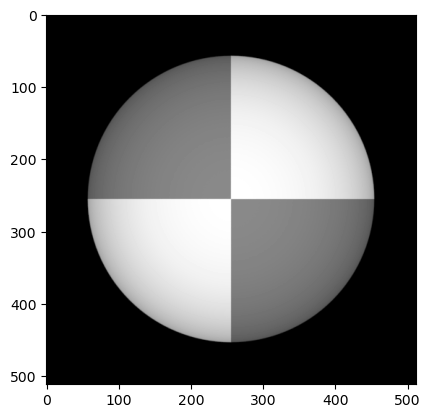

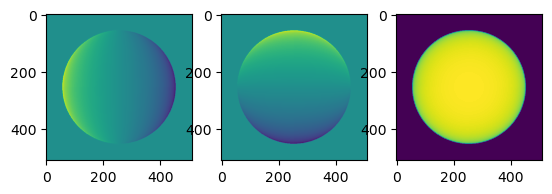

In [5]:
image_dir='./images/photometrics_images/SphereGray25/'
# obtain many images in a fixed view under different illumination
print('Loading images...\n')
[image_stack, scriptV] = load_syn_images(image_dir)
[h, w, n] = image_stack.shape
print('Finish loading %d images.\n' % n)
# compute the surface gradient from the stack of imgs and light source mat
print('Computing surface albedo and normal map...\n')
[albedo, normals] = estimate_alb_nrm(image_stack, scriptV)
show_results_albedo_normals(albedo, normals)

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

(512, 512)


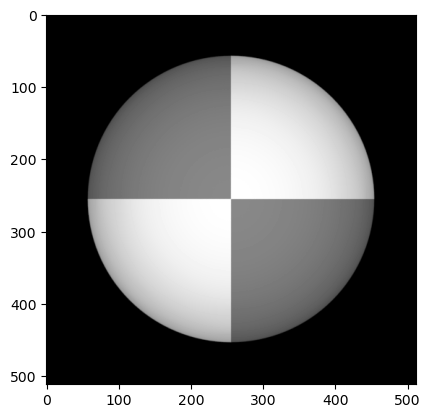

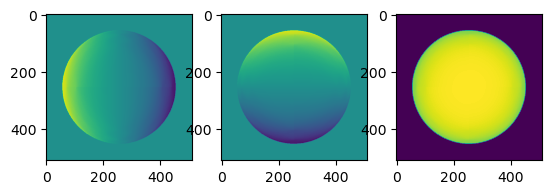

In [6]:
image_dir='./images/photometrics_images/SphereGray25/'
# obtain many images in a fixed view under different illumination
print('Loading images...\n')
[image_stack, scriptV] = load_syn_images(image_dir)
[h, w, n] = image_stack.shape
print('Finish loading %d images.\n' % n)
# compute the surface gradient from the stack of imgs and light source mat
print('Computing surface albedo and normal map...\n')
[albedo, normals] = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)
show_results_albedo_normals(albedo, normals)

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

(512, 512)


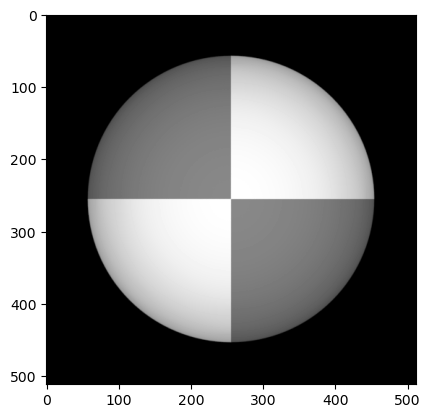

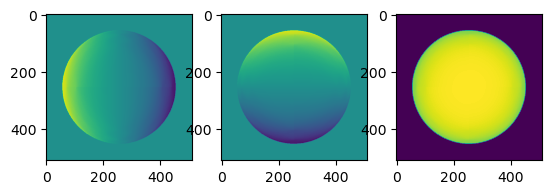

In [7]:
image_dir='./images/photometrics_images/SphereGray25/'
# obtain many images in a fixed view under different illumination
print('Loading images...\n')
[image_stack, scriptV] = load_syn_images(image_dir)
[h, w, n] = image_stack.shape
print('Finish loading %d images.\n' % n)
# compute the surface gradient from the stack of imgs and light source mat
print('Computing surface albedo and normal map...\n')
[albedo, normals] = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)
show_results_albedo_normals(albedo, normals)

### 1.2 Test of Integrability (10pts)

Before we can reconstruct the surface height map, it is required to compute the partial derivatives $\frac{\delta f}{\delta x}$ and $\frac{\delta f}{\delta y}$ (or *p* and *q* in the algorithm). The partial derivatives also give us a chance to double check our computation, namely the test of *integrability*.

1. Compute the partial derivatives (p and q in the algorithm) by filling in your code into **check_integrability()**.

In [8]:
def check_integrability(normals):
    #  CHECK_INTEGRABILITY check the surface gradient is acceptable
    #   normals: normal image
    #   p : df / dx
    #   q : df / dy
    #   SE : Squared Errors of the 2 second derivatives

    # initalization
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])
    
    """
    ================
    Your code here
    ================
    Compute p and q, where
    p measures value of df / dx
    q measures value of df / dy
    
    """
    # ignore the warning here as nan will be generated for cases when dividing by zero
    p = np.array([[point[0]/point[2] for point in row] for row in normals]) 
    q = np.array([[point[1]/point[2] for point in row] for row in normals])

    # change nan to 0
    p[p!=p] = 0
    q[q!=q] = 0
    
    """
    ================
    Your code here
    ================
    approximate second derivate by neighbor difference
    and compute the Squared Errors SE of the 2 second derivatives SE
    
    """
    # dp/dy
    p_2nd = np.diff(p.transpose()).transpose()[:,:-1] # slicing to get square matrix
    # dq/dx
    q_2nd = np.diff(q)[:-1,:]
    # matrix of SE (excluding the points on the left most and top most edges because they cannot be estimated with their neighbors)
    SE_smaller = (p_2nd - q_2nd)**2
    
    SE[:-1, :-1] = SE_smaller
    
    return p, q, SE

#if __name__ == '__main__':
#    normals = np.zeros([10,10,3])
#    check_integrability(normals)

2. Implement and compute the second derivatives according to the algorithm and perform the test of integrability by choosing a reasonable threshold. What could be the reasons for the errors? How does the test perform with different number of images used in the reconstruction process in Question 1?

<span style='color:red'> Answer: </span>  The warnings occured because p and q (the first order derivative of f) are determined from the measured values of the unit normal that we found, and this can sometimes result in dividing a real number by zero. For example, for some point , the measured value of the unit normal is , we have , . However,  can be zero here because there are some parts in the images without the target object present (e.g. the corners of the images). For these parts, no light is reflected ever under any conditions, the  value is therefore calculated as zero.

When using 5 images with shadow trick for Q1, 1893 outliers are found with threshold = 0.05 for the SE; 1457 outliers are found when using 25 images.

### 1.3 Shape by Integration (10pts)
To reconstruct the surface height map, we need to continuously integrate the partial derivatives over a path. However, as we are working with discrete structures, you will be simply summing their values.

The algorithm in the chapter presents a way to do the integration in column-major order, that is you start at the top-left corner and integrate along the first column, then go towards right along each row. Yet, it is also noticed that it would be better to use many different paths and average so as to spread around the errors in the derivative estimates.

1. Construct the surface height map using column-major order as described in the algorithm, then implement row-major path integration. Your code should now go to **construct_surface()**.

**Note**: By default, Numpy used row-major operations. So if you are unrolling an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to be column-major. Otherwise, if you are using the double for-loops without an unrolling operation, then this concern doesn’t apply.

**Hint**: You could further inspect the shape of the objects and normal directions by using **matplotlib.pyplot.quiver** function. You will have to choose appropriate sub-sampling ratios for proper illustration. You code goes to the **show_results()** in the first code cell.

In [9]:
def construct_surface(p, q, path_type='column'):

    '''
    CONSTRUCT_SURFACE construct the surface function represented as height_map
       p : measures value of df / dx
       q : measures value of df / dy
       path_type: type of path to construct height_map, either 'column',
       'row', or 'average'
       height_map: the reconstructed surface
    '''
    
    h, w = p.shape
    height_map = np.zeros([h, w])
    
    if path_type=='column':
        """
        ================
        Your code here
        ================
        % top left corner of height_map is zero
        % for each pixel in the left column of height_map
        %   height_value = previous_height_value + corresponding_q_value
        
        % for each row
        %   for each element of the row except for leftmost
        %       height_value = previous_height_value + corresponding_p_value
        
        """
        
        # top left corner of height_map is zero
        height_map[0][0] = 0
        
        # loop over left most column and add corresponding q value
        for pixel_col in range(1,h):
            height_map[pixel_col][0] = height_map[pixel_col - 1][0] + q[pixel_col][0]
        
        # loop over all remaining pixels and add corresponding p value
        for row in range(h):
            for pixel in range(1,w):
                height_map[row][pixel] = height_map[row][pixel - 1] + p[row][pixel] 
        
    elif path_type=='row':
        """
        ================
        Your code here
        ================
        """
        
        # top left corner of height_map is zero
        height_map[0][0] = 0
        
        # loop over top row and add corresponding p value
        for pixel_row in range(1,w):
            height_map[0][pixel_row] = height_map[0][pixel_row - 1] + p[0][pixel_row]
        
        # loop over all remaining pixels and add corresponding q value
        for col in range(w):
            for row in range(1,h):
                height_map[row][col] = height_map[row - 1][col] + q[row][col]
        
    elif path_type=='average':
        """
        ================
        Your code here
        ================
        """
        height_map_col = construct_surface(p, q, path_type='column')
        
        height_map_row = construct_surface(p, q, path_type='row')
        
        height_map = (height_map_col + height_map_row) / 2
        
    return height_map

2. What are the differences in the results of the two paths?


<span style='color:red'> Answer: </span> Integrating with column path will lead to a height map with accurate surface constraints for the x direction but not the y direction, as the surface constraints for the y direction is only dependent on that of the pixels in the left most column. So integration with column path may create horizontal ridges. Row integration path is exactly the opposite.

3. Now, take the average of the results. Do you see any improvement compared to when using only one path? Are the construction results different with different number of images being used?

<span style='color:red'> Answer: </span> The height map is more realistic now because it combines both integration results and preserve the surface constraints from both directions for all the pixels. When using more images, the construction of the gray sphere looks more smooth, this is because the error becomes smaller when estimating the normals using more measurements from different angles.

Loading images...

Image size (H*W): 512*512
Finish loading 5 images.

Computing surface albedo and normal map...

Integrability checking



C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:23: RuntimeWarning: invalid value encountered in double_scalars
  p = np.array([[point[0]/point[2] for point in row] for row in normals])
C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:24: RuntimeWarning: invalid value encountered in double_scalars
  q = np.array([[point[1]/point[2] for point in row] for row in normals])


Number of outliers: 1893

(512, 512)


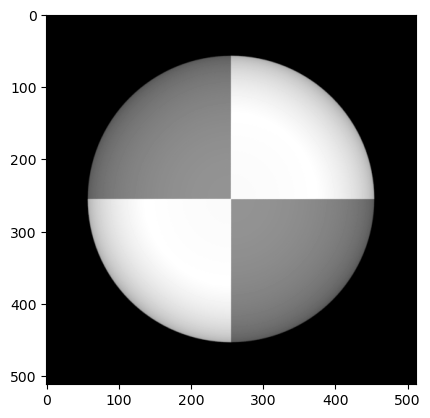

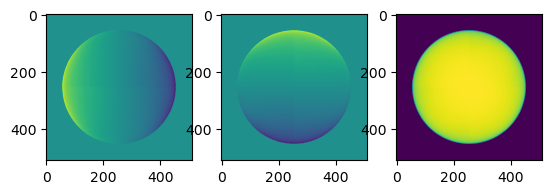

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


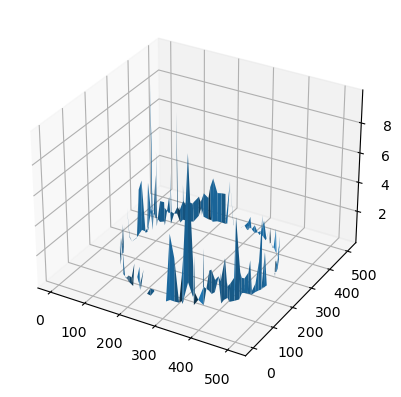

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


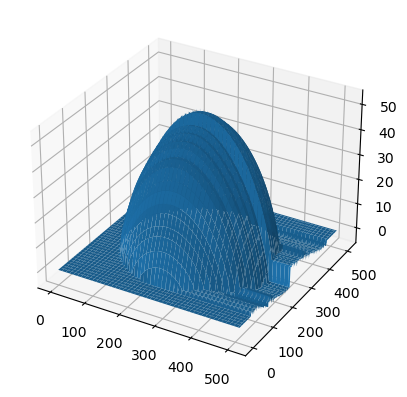

In [10]:
"""
can change the parameters here to experiment with different datasets and integration path
"""
image_dir='./images/photometrics_images/SphereGray5/'
# obtain many images in a fixed view under different illumination
print('Loading images...\n')
[image_stack, scriptV] = load_syn_images(image_dir)
[h, w, n] = image_stack.shape
print('Finish loading %d images.\n' % n)

# compute the surface gradient from the stack of imgs and light source mat
print('Computing surface albedo and normal map...\n')
[albedo, normals] = estimate_alb_nrm(image_stack, scriptV)


# integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
print('Integrability checking\n')
[p, q, SE] = check_integrability(normals)

threshold = 0.005;
print('Number of outliers: %d\n' % np.sum(SE > threshold))
SE[SE <= threshold] = float('nan') # for good visualization

# compute the surface height
height_map = construct_surface( p, q, path_type='row' )

# show results
show_results(albedo, normals, height_map, SE)

### 1.4 Experiments with different objects (15pts)
In this part, you will try to run the photometric stereo algorithm in various number of scenarios to see how well it can be generalized.

1. Run the algorithm and show the results for the MonkeyGray model. 

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking



C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:23: RuntimeWarning: invalid value encountered in double_scalars
  p = np.array([[point[0]/point[2] for point in row] for row in normals])
C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:24: RuntimeWarning: invalid value encountered in double_scalars
  q = np.array([[point[1]/point[2] for point in row] for row in normals])


Number of outliers: 4739

(512, 512)


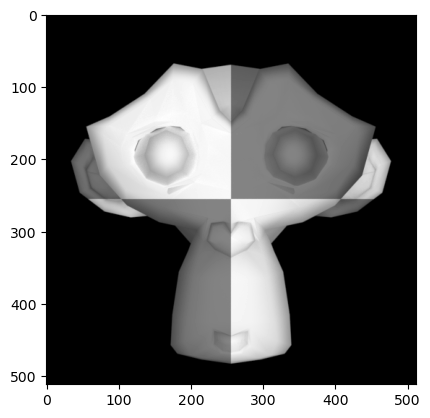

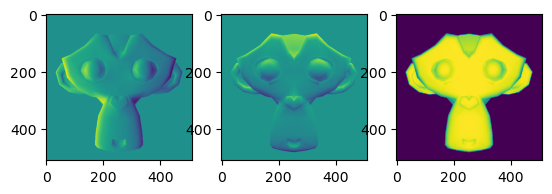

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


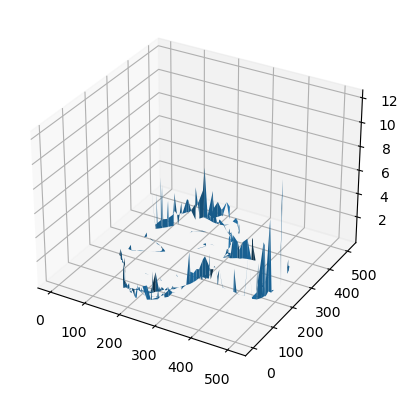

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


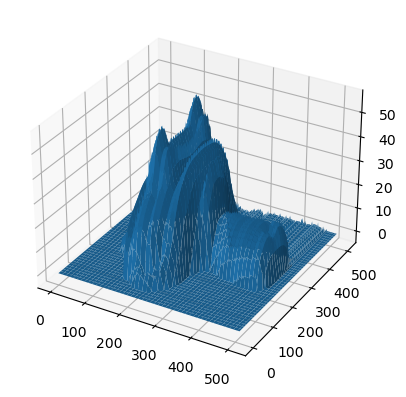

In [11]:
def photometric_stereo(image_dir='./images/photometrics_images/SphereGray5/' ):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_syn_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    [albedo, normals] = estimate_alb_nrm(image_stack, scriptV)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    [p, q, SE] = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface( p, q )

    # show results
    show_results(albedo, normals, height_map, SE)

## Face
def photometric_stereo_face(image_dir='./images/photometrics_images/yaleB02/'):
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    p, q, SE = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q )

    # show results
    show_results(albedo, normals, height_map, SE)
    
## Apple
def photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/'):
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_alb_nrm(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    p, q, SE = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q )

    # show results
    show_results(albedo, normals, height_map, SE)

    
if __name__ == '__main__':
    photometric_stereo(image_dir='./images/photometrics_images/MonkeyGray/')
#     photometric_stereo_face()
#     photometric_stereo_apple()

2. The albedo results of the monkey may comprise more albedo errors than in case of the sphere. Observe and describe the errors. What could be the reason for those errors? You may want to experiment with different number of images as you did in Question 1 to see the effects. 

Loading images...

Image size (H*W): 512*512
Finish loading 5 images.

Computing surface albedo and normal map...

Integrability checking



C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:23: RuntimeWarning: invalid value encountered in double_scalars
  p = np.array([[point[0]/point[2] for point in row] for row in normals])
C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:24: RuntimeWarning: invalid value encountered in double_scalars
  q = np.array([[point[1]/point[2] for point in row] for row in normals])


Number of outliers: 1893

(512, 512)


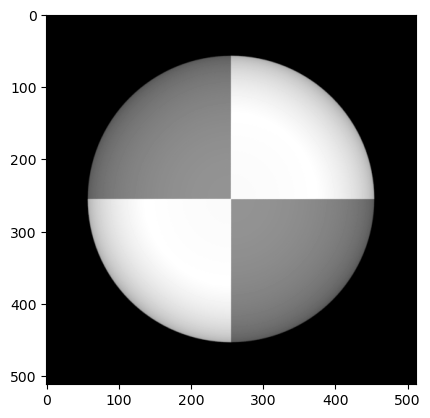

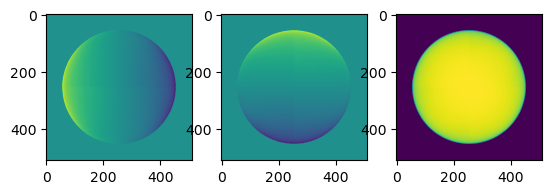

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


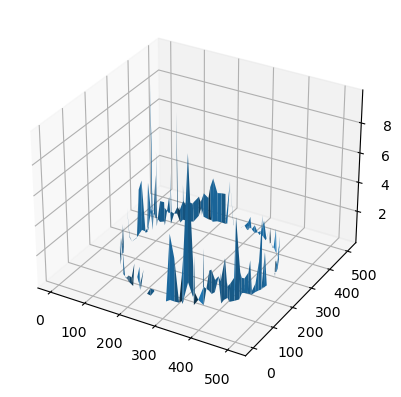

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


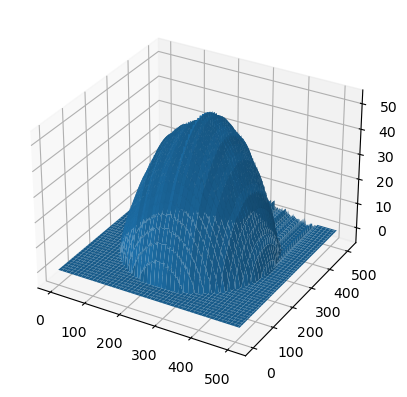

In [12]:
photometric_stereo(image_dir='./images/photometrics_images/SphereGray5/')

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking



C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:23: RuntimeWarning: invalid value encountered in double_scalars
  p = np.array([[point[0]/point[2] for point in row] for row in normals])
C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:24: RuntimeWarning: invalid value encountered in double_scalars
  q = np.array([[point[1]/point[2] for point in row] for row in normals])


Number of outliers: 1457

(512, 512)


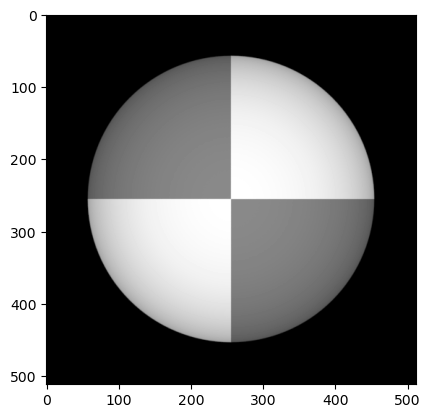

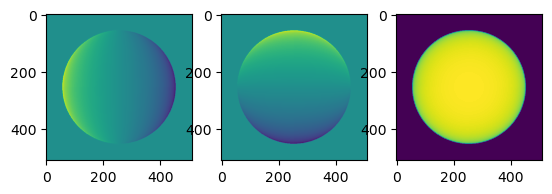

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


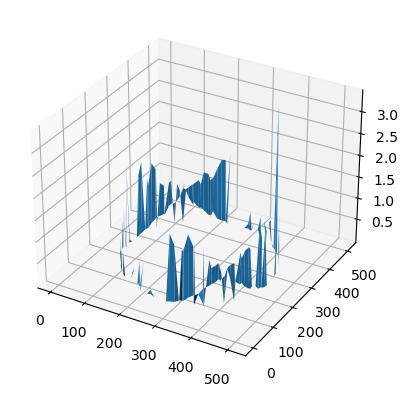

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


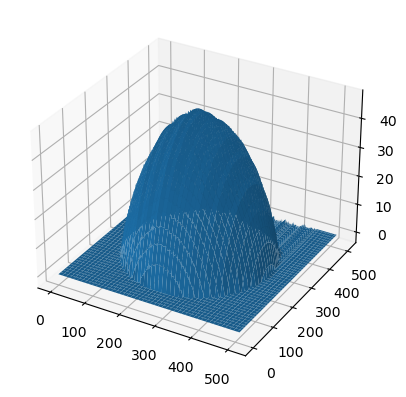

In [13]:
photometric_stereo(image_dir='./images/photometrics_images/SphereGray25/')

<span style='color:red'> Answer: </span> In the synthetic picture of the monkey and the sphere, we have sharp/clean partitions across different part of the object. In each partition, the reflectance of the surface (measured by albedo) is uniformly the same. This means the map of albedo should not have much change of the albedo magnitude in each partition. Visually, the map optimally looks 'flat' in 2D without variations of the grey scale in each partition. 

However, the albedo map of the grey monkey model does not show this tendency enough. We could clearly see the "shadows" around many details of the monkey in the map, such as the concave and groove structures. The albedo map of the grey sphere is better. Visually, we see less variations of the albedo scale of the pixels in each partition, the map looks more "flat" with less shadows. When the number of the images increases from 5 to 25, the albedo map looks even flatter, the color scale in each partition looks more consistent. 

The reason why there is errors could be as follow. The surface of the monkey object is less smooth than the sphere. This could lead to a more complex reflection (eg. direction) of the light on the monkey object and even inter-reflections. Even we captured more images from more angles for the monkey, this may still not enough to recover an accurate reflected light field both magnitude wise and direction wise; In other word, the albedo is prone to more errors for a less smooth object when there are not sufficient images captured.


3. How do you think that could help solving these errors?

<span style='color:red'> Answer: </span>  Capturing more images from more angles to provide more information for the recovery of the photometric stereo. 

controlling the locations of lights and cameras so that they are reciprocal, such as switching the position of lights and cameras conceptually.

So far, we have assumed that albedos are 1-channel grayscale images and that input images are also 1-channel. To work with 3-channel images, a simple solution is to split the input image into separate channels and treat them individually. Yet, that would generate a small problem while constructing the surface normal map if a pixel value in a channel is zero.

1. Update the implementation to work for 3-channel RGB inputs and test it with 2 models SphereColor and MonkeyColor. 
2. Explain your changes and show your results. 

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking



C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:23: RuntimeWarning: invalid value encountered in double_scalars
  p = np.array([[point[0]/point[2] for point in row] for row in normals])
C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3225670918.py:24: RuntimeWarning: invalid value encountered in double_scalars
  q = np.array([[point[1]/point[2] for point in row] for row in normals])


Number of outliers: 4064

(512, 512)


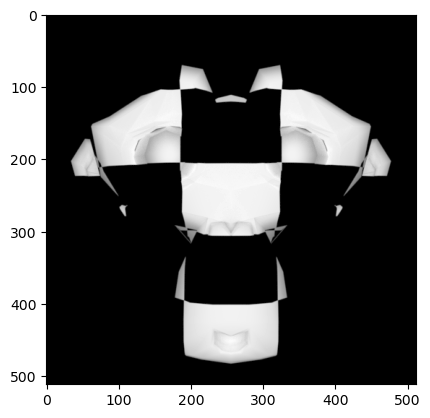

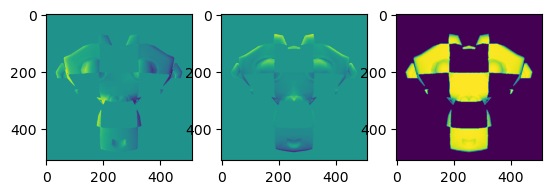

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


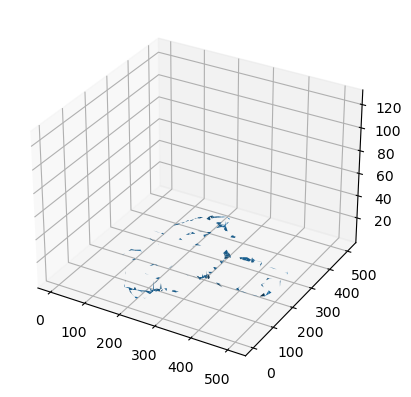

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


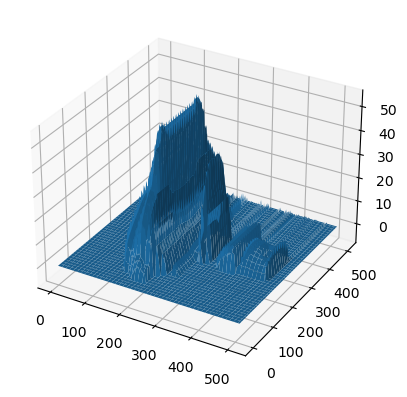

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 0

(512, 512)


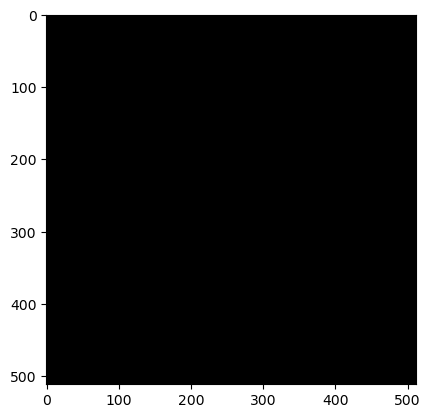

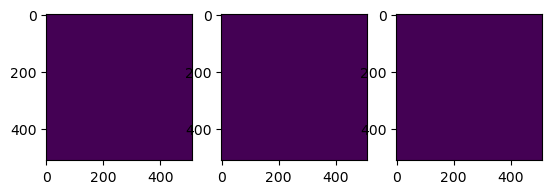

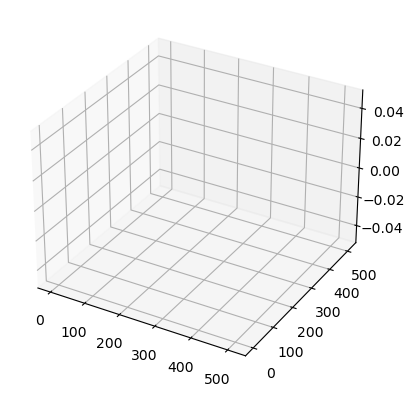

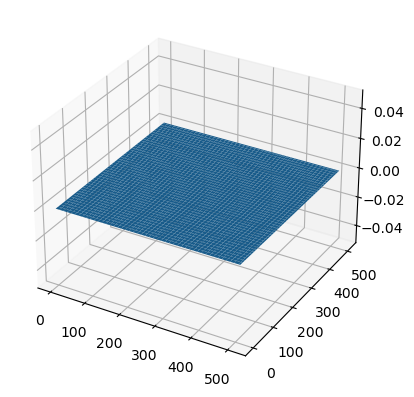

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 4875

(512, 512)


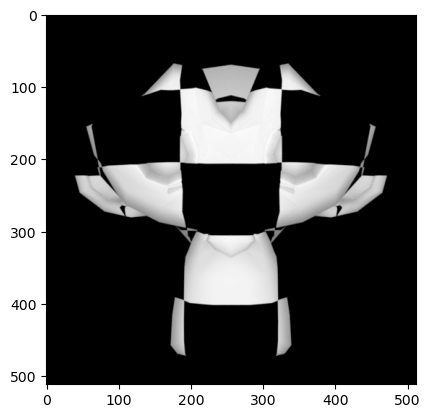

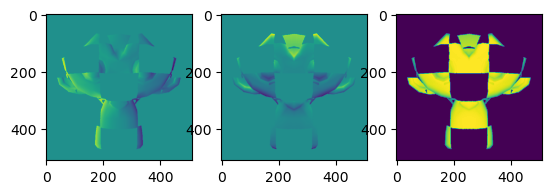

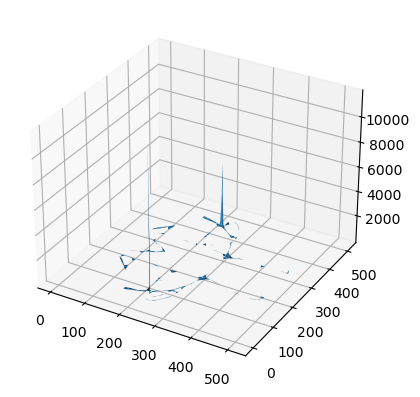

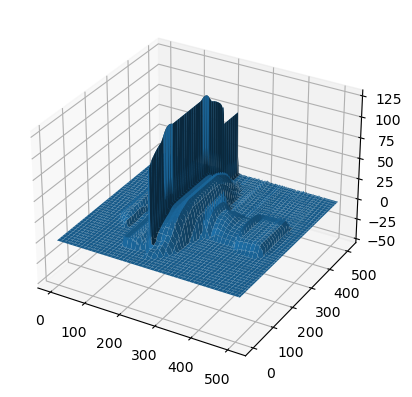

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 13150

(512, 512)


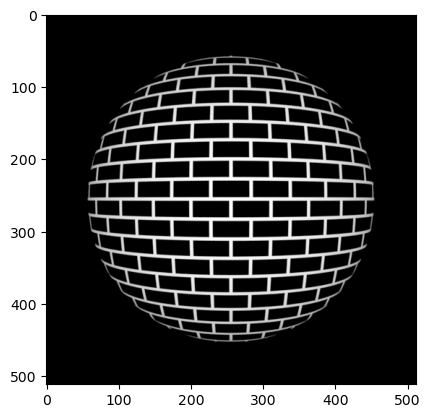

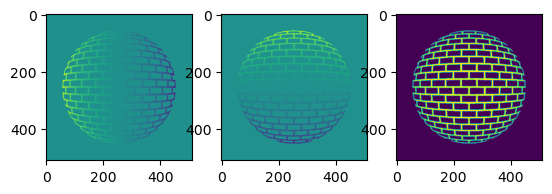

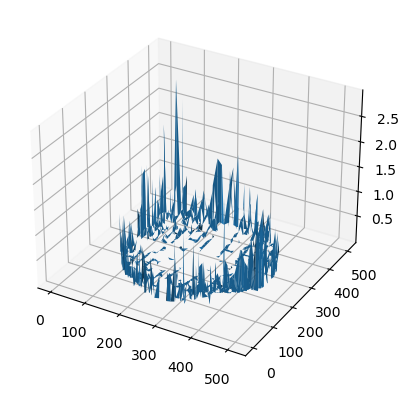

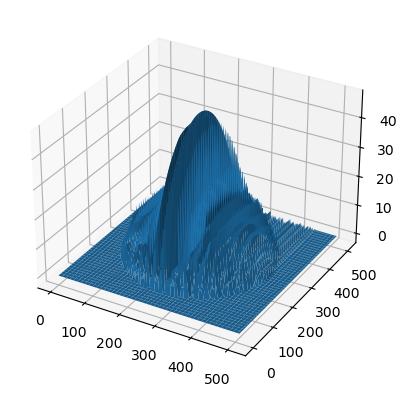

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 13048

(512, 512)


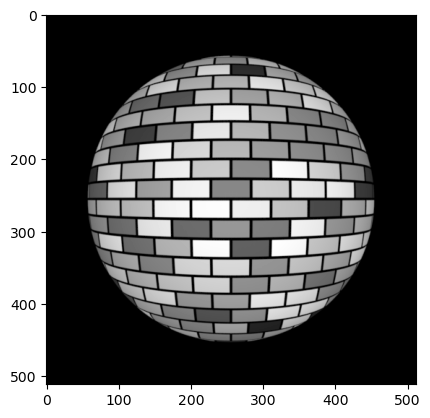

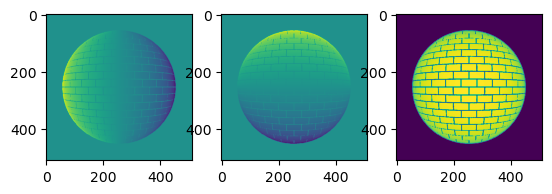

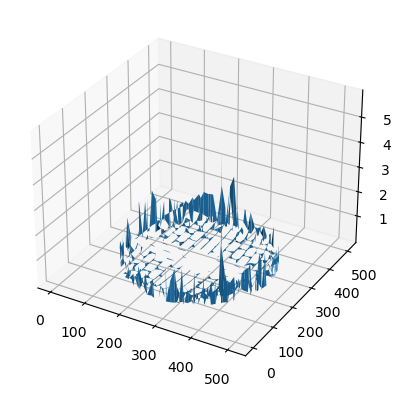

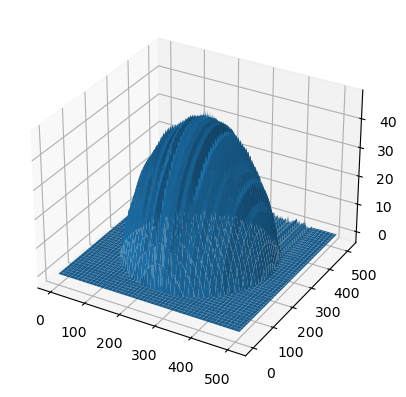

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 13194

(512, 512)


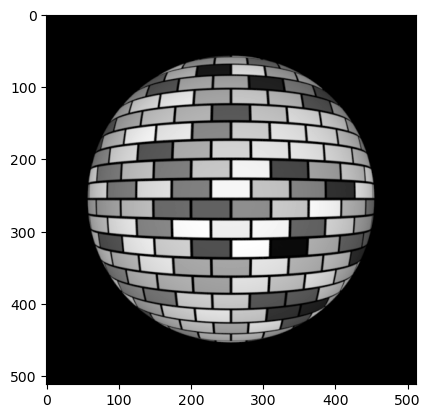

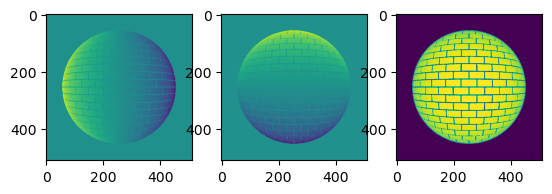

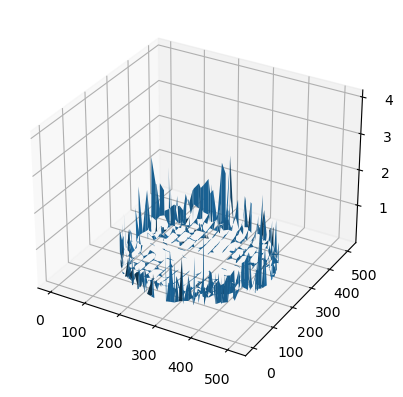

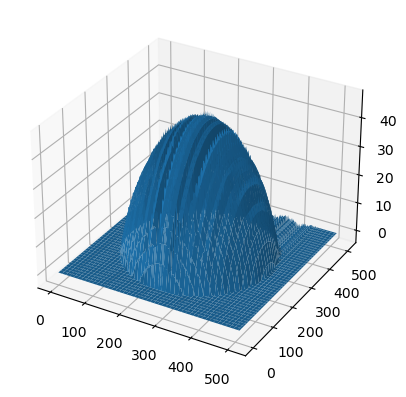

In [14]:
def photometric_stereo_RGB(image_dir, channel):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_syn_images(image_dir, channel)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    [albedo, normals] = estimate_alb_nrm(image_stack, scriptV)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    [p, q, SE] = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface( p, q )

    # show results
    show_results(albedo, normals, height_map, SE)
if __name__ == '__main__':    
    photometric_stereo_RGB(image_dir='./images/photometrics_images/MonkeyColor/', channel=0)
    photometric_stereo_RGB(image_dir='./images/photometrics_images/MonkeyColor/', channel=1)
    photometric_stereo_RGB(image_dir='./images/photometrics_images/MonkeyColor/', channel=2)
    photometric_stereo_RGB(image_dir='./images/photometrics_images/SphereColor/', channel=0)
    photometric_stereo_RGB(image_dir='./images/photometrics_images/SphereColor/', channel=1)
    photometric_stereo_RGB(image_dir='./images/photometrics_images/SphereColor/', channel=2)

<span style='color:red'> Answer: </span> We treat each channel individually by adding a channel argument in the function above. So when loading the images, we can choose which channel's values we want to use.

3. Observe the problem in the constructed surface normal map and height map, explain why a zero pixel could be a problem and propose a way to overcome that.

<span style='color:red'> Answer: </span> When pixel values are zero in a certain channel, from the surface normal map, we observe that the normals are zero vectors for these pixels as the values of the normals are always zero from whichever dimension of the normals. This means we could not find the normals when pixel value is zero. In channel with only zeros, height is zero all over the image (e.g. green channel for MonkeyColor). In channel with zeros mixed with non-zero values, height map has abnormal sudden peaks at where it should not be such obvious height increase (e.g. red and blue channel for MonkeyColor, red channel for Sphere color).

Reason for normal vectors are zeros: no light is reflected in this channel (object does not contain color of this channel at all) no matter what angle, then $i(x, y) $ and $I$ are zero vector/matrix for these pixels in formula $Ii(x, y) = IVg(x, y)$. In numpy, $g(x, y)$ is given as zero vector, its normal vector is therefore also zero.

Reason for height map having weird peaks: because the zero normal vectors are mixed with other non-zero vectors, the partial derivatives of the height recovered from the normals ($p$ and $q$ in book) of the map become zeros too at zero pixels. The way we construct the surface is essentially by adding the partial derivatives to pixel's neigbor's height values. When derivatives are zeros, the height values are also very small. So when derivatives are no longer zeros, height value suddenly increases and this appears as those peaks in the visualizations.

A way to overcome zero pixels: convert RGB images to grey-scale images. For example, using the standard RGB to grayscale conversion formula or .imread() function from openCV library.

Now, it's the time to try the algorithm on real-world datasets. For that purpose, we are going to use the [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html)

1. Run the algorithm for the Yale Face images (included in the lab material). 
2. Observe and discuss the results for different integration paths. 

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [15]:
def photometric_stereo_face(image_dir='./images/photometrics_images/yaleB02/', shadow_trick=False, path_type='column'):
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    p, q, SE = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q, path_type)

    # show results
    show_results(albedo, normals, height_map, SE)

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5350

(192, 168)


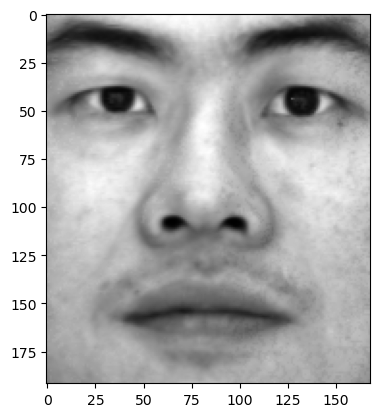

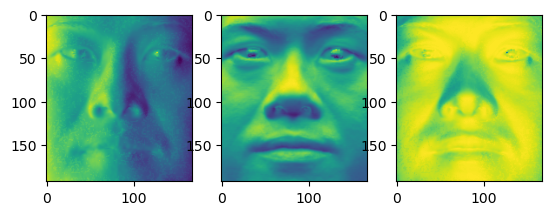

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


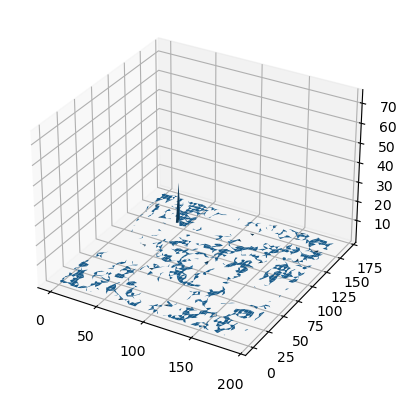

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


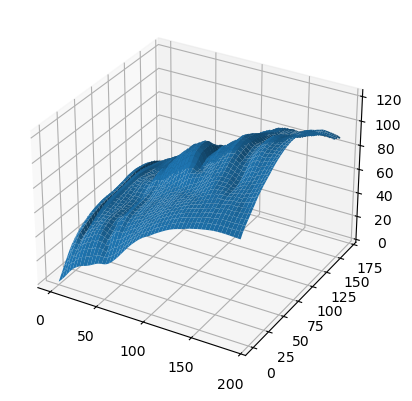

In [16]:
photometric_stereo_face(path_type='column')

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5350

(192, 168)


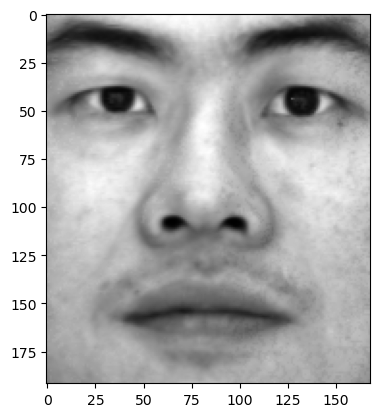

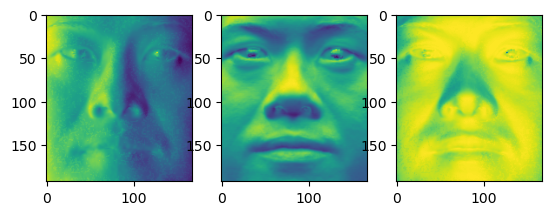

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


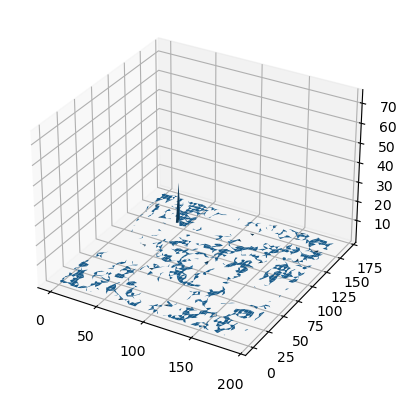

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


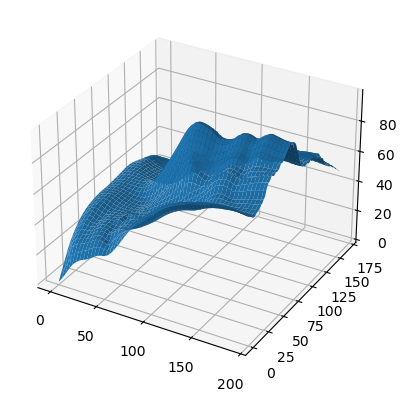

In [17]:
photometric_stereo_face(path_type='row')

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 5350

(192, 168)


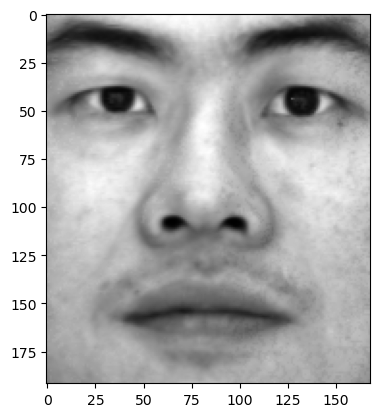

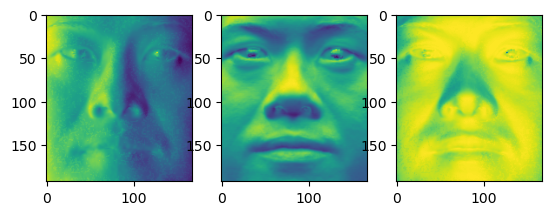

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


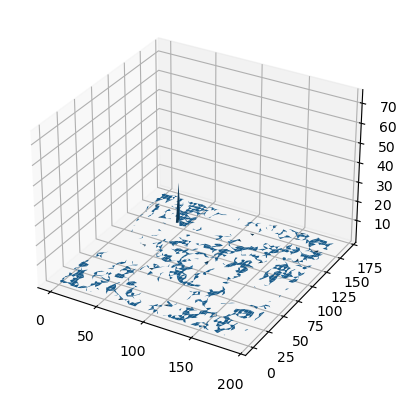

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


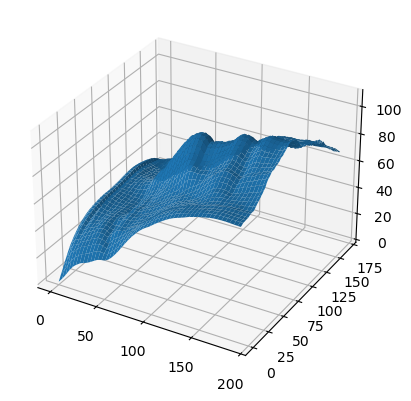

In [18]:
photometric_stereo_face(path_type='average')

<span style='color:red'> Answer: </span> results using different integration paths are different. Column path leads to a height map with less accurate curvature along the y direction, for example, the face may look flatter than the reality (nose almost disappear). Row path leads to an inaccurate map more from the x direction, for example, the shape of the mouth from x direction has a ridge in the middle but not smooth like a normal mouth. Average is the average of both path, the map has medium height differences and looks more realistic.

The reason is as follows. The column method first integrate in the left column along the y-axis, then for other columns, their information along the y-axis is only determined by the left most column, this means the map from the y direction may not be accurate. The same with the row path, it starts to integrate from the first row along the x-axis; for the rest rows, the shape of the height map along the x-axis is only determained by the value of the first row. This means for column methods, the map only has correct and smooth curvature along x-axis but loses constraints from y-axis, and row method only has smooth curvature along y-axis but loses constraints from x-axis. The average method combines the both methods and for all rows and columns, their information along both direction is present. This is why the average method produces the most realistic result.

3. Discuss how the images violate the assumptions of the shape-from-shading methods. Remember to include specific input images to illustrate your points. 


<span style='color:red'> Answer: </span> 

(a) Lambertian reflectance may be violated. Human skin can have some smooth parts that do not diffuse light well enough, for example, the tip of the nose, the eyeballs, etc. 

(b) We assume that there is no ambient light, the only light source the faces receive it the light source we set. However, although the ambient light is deducted from the images as a constant, it does not assure that the ambient light was consistent when every picture was takenm for example, the source light can be reflected by the walls in the environment and this influences images differently from different angles. However, this violation is hard to verify.

(c) the light source intensity is not uniform for all the pictures. With the formula we use, we assume that the intensities in the images are only influenced by the surface shape and the direction of the light, it is assumed that the light intensity is consistent for every image. However, from the images below you can clearly see many images are obviously dark while others are fully illuminated. This could cause the height map to be biased, especially **around the shadow areas when the light is not sufficient**.

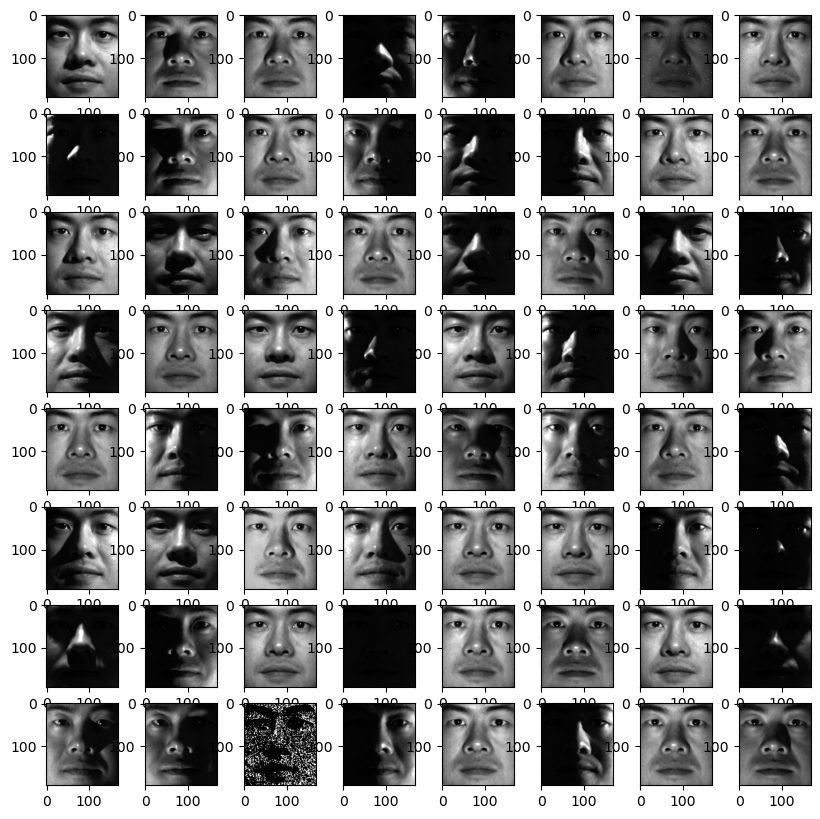

In [21]:
[image_stack, scriptV] = load_face_images(image_dir='./images/photometrics_images/yaleB02/')

fig, axs = plt.subplots(8, 8, figsize=(10, 10))
for i in range(8):
    for j in range(8):
        axs[i, j].imshow(image_stack[:, :, 8*i+j], cmap="gray")

4. How would the results improve when the problematic images are all removed? Try it out and show the results here.

<span style='color:red'> Answer: </span> In the function above, removed 12 pictures with too much shadow in the picture. However, the violation of the Lambert's rule cannot be removed as it existes in all pictures (the SE is still high around the right eye's area); as well as the violation of no ambient light, we couldn't remove the ambient light correctly without more information. The results still do not match the realistic properties of a human face entirely, however, the curvature of the height map has less unrealistic "grooves" or "ridges" around the shadow areas, for example, the two sides of the nose. 

In [22]:
def photometric_stereo_face_removed(image_dir='./images/photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    [image_stack, scriptV] = load_face_images(image_dir)
    index_remove = [2, 7, 12, 14, 15, 17, 19, 29, 42, 44, 53, 59]
    index_remained = [i for i in range(64)]
    for i in index_remove:
        index_remained.remove(i)
    image_stack_removed = image_stack[:,:,index_remained]
    scriptV_removed = scriptV[index_remained, :]
    [h, w, n] = image_stack_removed.shape
    print('Finish loading %d images.\n' % n)
    
    
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_alb_nrm(image_stack_removed, scriptV_removed, shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    p, q, SE = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q, path_type)

    # show results
    show_results(albedo, normals, height_map, SE)

Finish loading 52 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 6870

(192, 168)


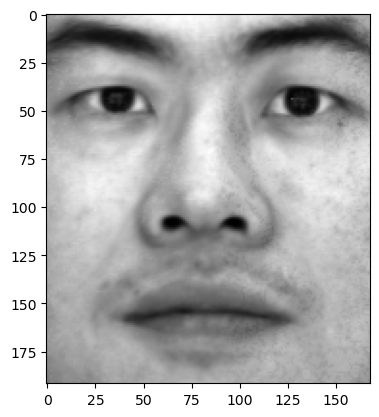

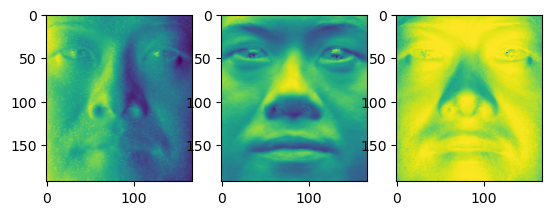

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


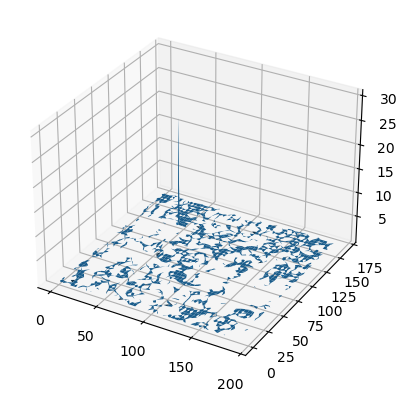

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


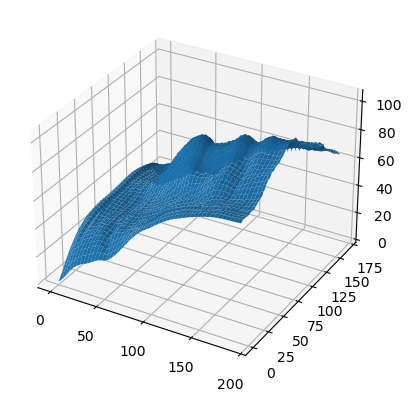

In [23]:
photometric_stereo_face_removed()

Finally, show your results on real-world 3-channel RGB inputs, contained in the "Apple" folder, taken from [this dataset](http://vision.ucsd.edu/~nalldrin/research/cvpr08/datasets/) from the University of California San Diego.

1. Observe and discuss the results for different integration paths. 

<span style='color:red'> Answer: </span> The height map is not correct no matter using with integration path. This is possibly because the object apple severely violateS the assumption of Lambertian reflectance - the surface diffusively reflects. The surface is too smooth in this case. The reflected light intensity does not relate to the cosine of the surface normal and the direction of the light. However, this relation is the most fundamental requirement for the photometric stereo problem using our methods and formulas to work, so the violation of this law leads to the total failure of the calculation. As you can see in the height maps, there are only noises, no shape of an apple can be seen. 

In [24]:
## Apple
def photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='column'):
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_alb_nrm(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    p, q, SE = check_integrability(normals)

    threshold = 0.005;
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    height_map = construct_surface(p, q, path_type)

    # show results
    show_results(albedo, normals, height_map, SE)

Finish loading 100 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 364815

(696, 646)


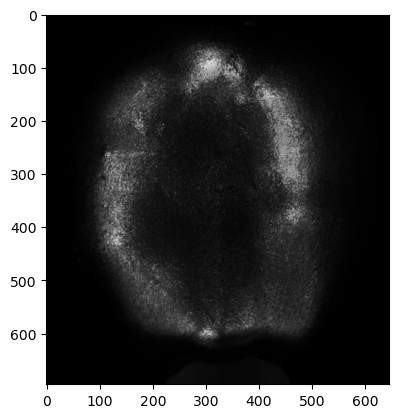

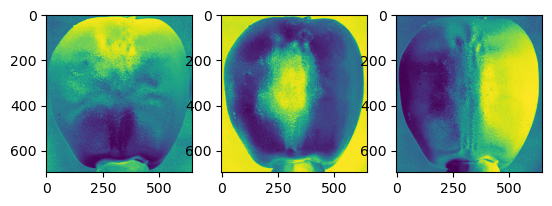

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


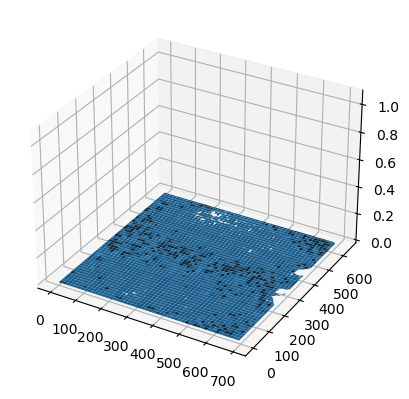

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


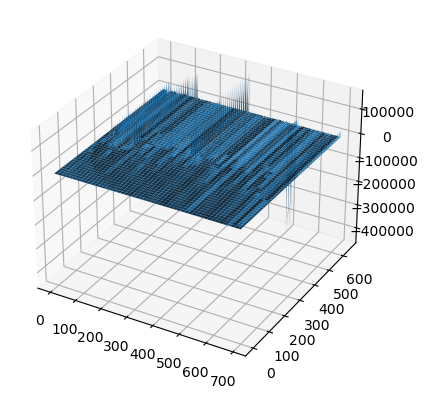

In [25]:
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='column')

Finish loading 100 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 365173

(696, 646)


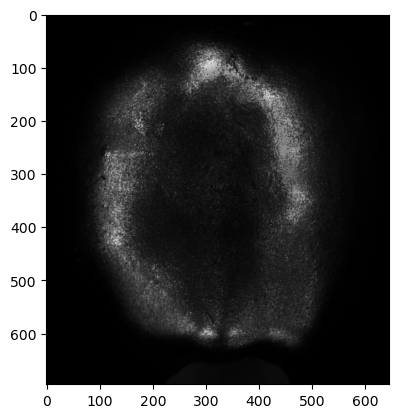

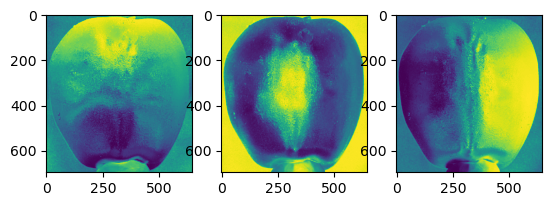

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


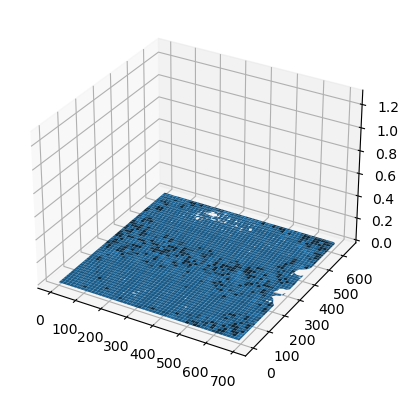

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


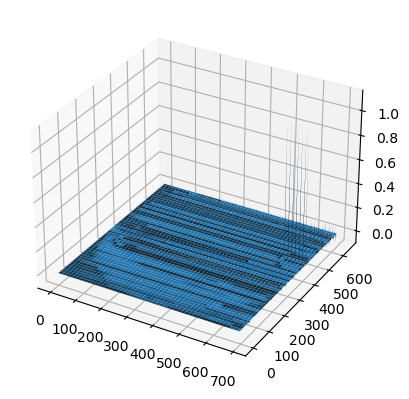

In [26]:
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='row')

Finish loading 100 images.

Computing surface albedo and normal map...

Integrability checking
Number of outliers: 363798

(696, 646)


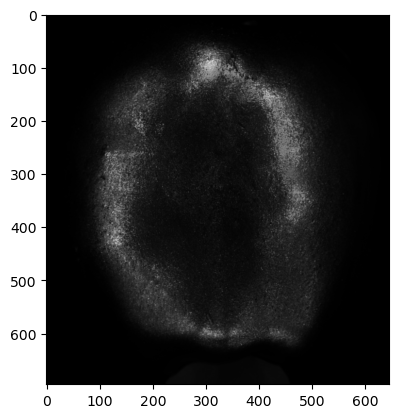

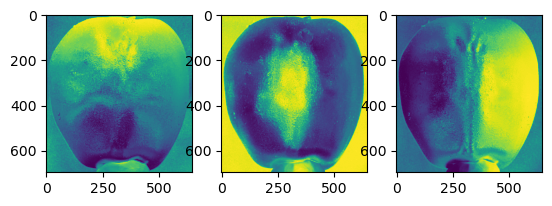

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:164: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


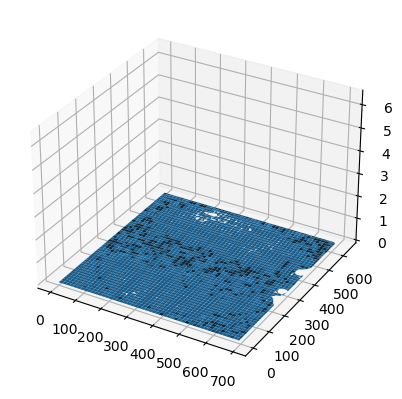

C:\Users\tsats\AppData\Local\Temp\ipykernel_2276\3914573086.py:171: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


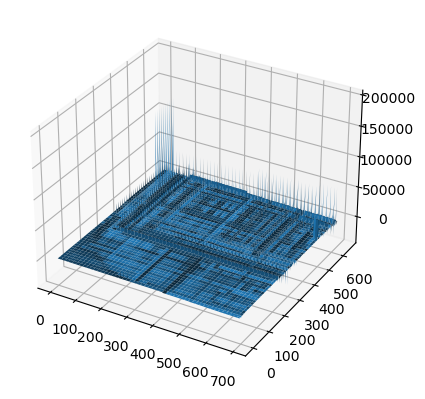

In [27]:
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='average')

## 2 Colour Spaces (20pts)

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space.

### 2.1 RGB Colour Model (3pts)

Why do we use RGB colour model as a basis of our digital cameras and photography? How does a standard digital camera capture the full RGB colour image?

<span style='color:red'> Answer: </span> RGB are three primary colors in natural light, any visible colors humans can see can be composed by the three colors. So capturing images with RGB as 3 basis channels would help to produce more true-to-the-life colors. This is because RGB color model resembles what humans perceives for colors, this makes sure the photos resemble what humans see as as much as possible. A standard camera mostly have sensors using filtering to capture lights in three primary colors, then the camera combines the 3 channels to create the full image.

### 2.2 Colour Space Conversion (10pts)

Create a function to convert an RGB image into the following colour spaces by using the template code you are provided ConvertColourSpace.py and other sub-functions. Visualize the new image and its channels separately in the same figure. That is, for example, in the case of HSV colour space, you need to visualize the converted HSV image, and its Hue, Saturation and Value channels separately (4 images, 1 figure). Do not change the already given code.

__Opponent Colour Space__

$\begin{pmatrix}
O_1 \\
O_2 \\
O_3 
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R-G}{\sqrt{2}} \\
\frac{R+G-2B}{\sqrt{6}} \\
\frac{R+G+B}{\sqrt{3}} 
\end{pmatrix}$ 

__Normalized RGB (rgb) Colour Space__

$\begin{pmatrix}
r \\
g \\
b 
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R}{R+G+B} \\
\frac{G}{R+G+B} \\
\frac{B}{R+G+B} 
\end{pmatrix}$ 

__HSV Colour Space__

Convert the RGB image into HSV Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

__YCbCr Colour Space__

Convert the RGB image into YCbCr Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Note, you need to arrange the channels in $Y, C_b$ and $C_r$ order.

__Grayscale__

Convert the RGB image into grayscale by using 3 different methods mentioned in
https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/
In the end, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 in the same figure.




In [28]:
def rgb2grays(input_image):
    # converts an RGB into grayscale by using 4 different methods
    [R, G, B] = getColourChannels(input_image)
    # ligtness method
    light = (np.maximum(R, G, B) + np.minimum(R, G, B)) / 2    
    # average method
    avg = (R + G + B)/3
    # luminosity method
    lumi = 0.21*R + 0.72*G + 0.07*B
    # built-in opencv function 
    cvgray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
    # return four images for visualization
    [h, w, _] = input_image.shape
    new_image = np.zeros([h, w, 4])
    new_image[:, :, 0] = light
    new_image[:, :, 1] = avg
    new_image[:, :, 2] = lumi
    new_image[:, :, 3] = cvgray
    
    return new_image
    

def rgb2opponent(input_image):
    # converts an RGB image into opponent colour space
    [R, G, B] = getColourChannels(input_image)
    O1 = (R-G)/np.sqrt(2)
    O2 = (R+G-2*B)/np.sqrt(6)
    O3 = (R+G+B)/np.sqrt(3)
    [h, w, _] = input_image.shape
    new_image = np.zeros([h, w, 3])
    new_image[:, :, 0] = O1
    new_image[:, :, 1] = O2
    new_image[:, :, 2] = O3
    
    return new_image


def rgb2normedrgb(input_image):
    # converts an RGB image into normalized rgb colour space
    [R, G, B] = getColourChannels(input_image)
    r = R/(R+G+B)
    g = G/(R+G+B)
    b = B/(R+G+B)
    [h, w, _] = input_image.shape
    new_image = np.zeros([h, w, 3])
    new_image[:, :, 0] = r
    new_image[:, :, 1] = g
    new_image[:, :, 2] = b
    
    return new_image


def getColourChannels(input_image):
    R = input_image[:, :, 0]
    G = input_image[:, :, 1]
    B = input_image[:, :, 2]

    return [R, G, B]

In [29]:
def visualize(input_image, colorspace):
    # Fill in this function. Remember to remove the pass command
    if colorspace == 'gray':
        titles = ['lightness method', 'average method', 'luminosity method', 'built-in CV method']
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        for i in range(4):
            axs[i].set_title(titles[i], fontweight = "bold")
            axs[i].imshow(input_image[:,:,i], 'gray')
        fig.suptitle(colorspace + ' colorspace\n', fontsize = 16, fontweight = 'bold')
        
    elif colorspace == 'rgb':
        titles = ['converted image', 'red channel', 'green channel', 'blue channel']
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        axs[0].set_title(titles[0], fontweight = "bold")
        axs[0].imshow(input_image[...])
        for i in range(3):
            axs[i+1].set_title(titles[i+1], fontweight = "bold")
            axs[i+1].imshow(input_image[:,:,i], 'gray')
        fig.suptitle('normalized RGB colorspace\n', fontsize = 16, fontweight = 'bold')
        
        
    elif colorspace == 'opponent':
        titles = ['converted image', 'red-green', 'yellow-blue', 'luminance']   
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        [h, w, _] = input_image.shape
        vis = np.zeros([h, w, 3])
        for i in range(3):
            vis[:,:,i] = (input_image[:,:,i] - np.min(input_image[:,:,i])) / (np.max(input_image[:,:,i]) - np.min(input_image[:,:,i]))
        axs[0].set_title(titles[0], fontweight = "bold")
        axs[0].imshow(vis[...])
        for i in range(3):
            axs[i+1].set_title(titles[i+1], fontweight = "bold")
            axs[i+1].imshow(vis[:,:,i], 'gray')
        fig.suptitle('opponent colorspace\n', fontsize = 16, fontweight = 'bold')
        
    elif colorspace == 'hsv':
        titles = ['converted image', 'hue', 'satuation', 'brightness']
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        [h, w, _] = input_image.shape
        vis = np.zeros([h, w, 3])
        for i in range(3):
            vis[:,:,i] = (input_image[:,:,i] - np.min(input_image[:,:,i])) / (np.max(input_image[:,:,i]) - np.min(input_image[:,:,i]))
        axs[0].set_title(titles[0], fontweight = "bold")
        axs[0].imshow(vis[...])
        for i in range(3):
            axs[i+1].set_title(titles[i+1], fontweight = "bold")
            axs[i+1].imshow(vis[:,:,i], 'gray')
        fig.suptitle('HSV colorspace\n', fontsize = 16, fontweight = 'bold')
        
    elif colorspace == 'ycbcr':
        titles = ['converted image', 'y', 'cb', 'cr']
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        [h, w, _] = input_image.shape
        vis = np.zeros([h, w, 3])
        for i in range(3):
            vis[:,:,i] = (input_image[:,:,i] - np.min(input_image[:,:,i])) / (np.max(input_image[:,:,i]) - np.min(input_image[:,:,i]))
        axs[0].set_title(titles[0], fontweight = "bold")
        axs[0].imshow(vis[...])
        for i in range(3):
            axs[i+1].set_title(titles[i+1], fontweight = "bold")
            axs[i+1].imshow(vis[:,:,i], 'gray')
        fig.suptitle('YCbCr colorspace\n', fontsize = 16, fontweight = 'bold')

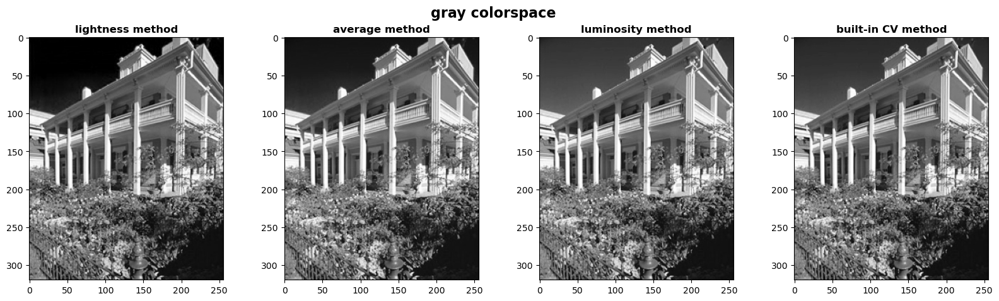

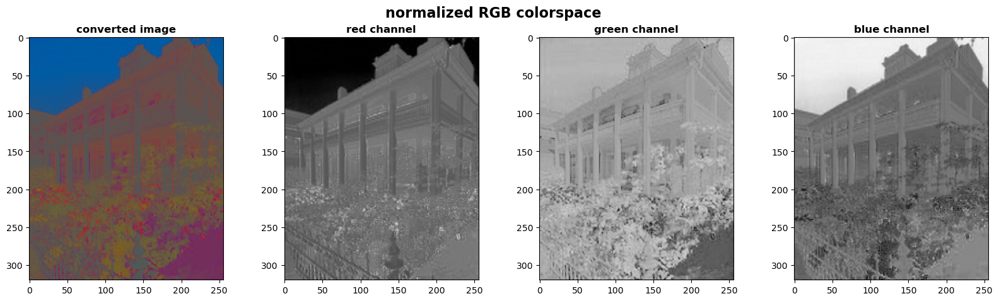

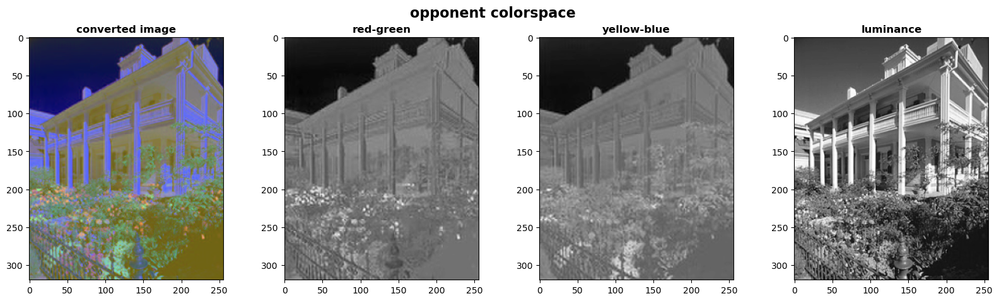

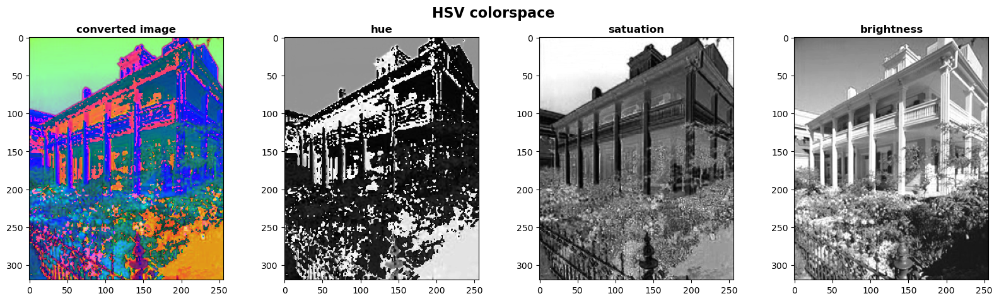

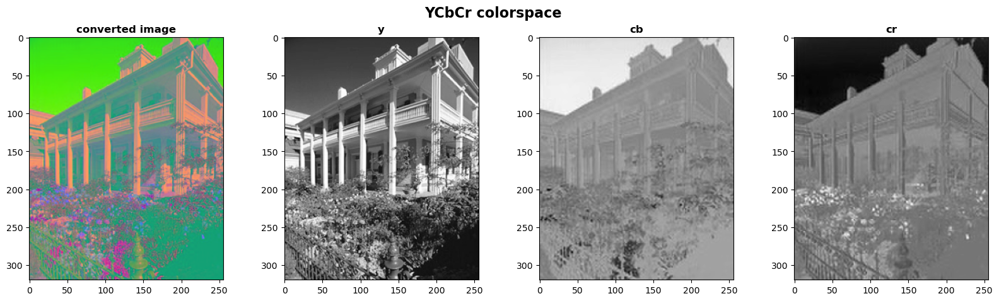

In [30]:
def ConvertColourSpace(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space, visualizes the
    color channels and returns the image in its new color space.

    Colorspace options:
      opponent
      rgb -> for normalized RGB
      hsv
      ycbcr
      gray

    P.S: Do not forget the visualization part!
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function
        new_image = rgb2opponent(input_image)

    elif colourspace.lower() == 'rgb':
        # fill in the rgb2opponent function
        new_image = rgb2normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
       # input_image = input_image / 255.0
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)


    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        ycrcb = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        y = ycrcb[:,:,0]
        cr = ycrcb[:,:,1]
        cb = ycrcb[:,:,2]
        [h, w, _] = input_image.shape
        new_image = np.zeros([h, w, 3])
        new_image[:,:,0] = y
        new_image[:,:,1] = cb
        new_image[:,:,2] = cr
        

    elif colourspace.lower() == 'gray':
        # fill in the rgb2opponent function
        new_image = rgb2grays(input_image)

    else:
        print('Error: Unknown colorspace type [%s]...' % colourspace)
        new_image = input_image

    visualize(new_image, colourspace)

    return new_image


if __name__ == '__main__':
    ## Replace the image name with a valid image
    img_path = r'C:\Users\tsats\Documents\Computer Vision 1\lab assignment\lab1 new\lab1\images\awb\awb.jpg'
    ## Read with opencv
    I = cv2.imread(img_path)
    ## Convert from BGR to RGB
    ## This is a shorthand.
    I = I[:, :, ::-1]
    gray = ConvertColourSpace(I, 'gray')
    rgb = ConvertColourSpace(I, 'rgb')
    opponent = ConvertColourSpace(I, 'opponent')
    hsv = ConvertColourSpace(I, 'hsv')
    ycbcr = ConvertColourSpace(I, 'ycbcr')

### 2.3 Colour Space Properties (5pts)

Explain each of those 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

<span style='color:red'> Answer: </span>

(1) gray scale: In this space, many color information is lost. However, it also reduce the complexity when processing the image computational wise, especially when color details are not important. Images may look more consistent, so noises from the environment and calibrations caused by the devices are also reduced.

(2) normalized RGB: Normalization is used to reduce the effects of light. Normalization can remove the highlighted regions, shadows and make the contours more clear, so that objects are easier to detect.

(3) opponent: There are theories suggest that people don't perceive colors in their RGB channels but in the channels of the opposed colors. The opponent color theory suggests that there are three opponent channels the cone photoreceptors are linked together to form three opposing color pairs: red versus green, blue versus yellow, and black versus white. Hence, the color space is developed to better recover the true color human eye sees.

(4) HSV: This color space separates color by its hue, saturation and brightness. This space helps people to properly define or find a color, as it is natural for humans to think about a color in terms of hue and saturation and brightness than in terms of additive or subtractive color components like the RGB space.

(5) YCbCr: This color space can separate brightness from colors. Green is naturally included as part of brightness because it's the color people are most sensitive to (in the visualization green color is very bright). By storing brightness and color data separately, compression algorithms can retain more brightness since humans are most sensitive to it and drop color. Using color subsampling, some color information can be dropped without a lot of negative impact on what you see. And, this color space uses gamma correction, so luminance can be optimized, again by taking advantage of  how humans see light and color. We are more sensitive to the differences between darker tones than we are differences between lighter tones. Gamma correction stores tones more efficiently and redistributes them closer to how we actually see them.

### 2.4 More on Colour Spaces (2pts)

Find one more colour space from the literature and simply explain its properties and give a use case.

<span style='color:red'> Answer: </span>

CMYK color space: The four letters stand for Cyan, Magenta, Yellow, and Key (or black) and it is a subtractive color model, as opposed to an additive color model like RGB. It subtracts the amount of white in the light showing through by working in levels of cyan, magenta, yellow, and key to achieve the desired color. This color space is more often used for printing instead of digitially displaying, as the ink used in printing reflects light but digital screens can produce and mix colored light. So using CMYK model can produce the real colors on the paper, while RGB color space for printing might create colors that are too dark.


## 3 Intrinsic Image Decomposition (15pts)
Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumption of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform one of the computational photography applications; material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>1. [^](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>2. [^](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/



1. What other components can an image be decomposed other than albedo and shading Give an example and explain your reasoning. *(4pts)*

*Write your answer here*

2. If you check the literature, you will see that almost all the intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that? *(2pts)*

*Write your answer here*

3. Show that you can actually reconstruct the original *turtle.png* image from its intrinsics using *turtle_albedo.png* and *turtle_shading.png*. In the end, your script should output a figure displaying the original image, its intrinsic images and the reconstructed one. Complete the code for function **iid_image_formation()**. *(4pts)*

In [ ]:
def iid_image_formation(albedo_img, shading_img):
    """
    ================
    Your code here
    ================
    """
    return

### Recoloring *(5pts)*
Manipulating colours in photographs is an important problem with many applications in computer vision. Since the aim for recolouring algorithms is just to manipulate colours, better results can be obtained for such a task if the albedo image is available as it is independent of confounding illumination effects.

Assume that you are given the *turtle.png* image and you have access to its
intrinsic images *turtle_albedo.png* and *turtle_shading.png*.
1. Find out the true material colour of the turtle in RGB space (which is uniform in this case).
2. Recolour the turtle image with pure green (0, 255, 0). Display the original turtle image and the recoloured version on the same figure. Complete the code for function **recoloring()**.

In [ ]:
def recoloring(albedo_img, shading_img):
    """
    ================
    Your code here
    ================
    """
    return

3. Although you have recoloured the object with pure green, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

*Write your answer here*

Note that this was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

## 4 Colour Constancy (15pts)

Colour constancy is the ability to perceive colors of objects, invariant to the colour of the light source. The aim for colour constancy algorithms is first to estimate the illuminant of the light source, and then correct the image so that the corrected image appears to be taken under a canonical (white) light source. The task of the automatic white balance (AWB) is to do the same in digital cameras so that the images taken by a digital camera look as natural as possible.

In this part of the assignment, you will implement the most famous colour constancy algorithm; *Grey-World Algorithm*.

### Grey-World Algorithm
The algorithm assumes that, under a white light source, the average colour in a scene should be achromatic (grey, [128, 128, 128]).

1. Complete the function to apply colour correction to an RGB image by using Grey-World algorithm. Display the original image and the colour corrected one on the same figure. Use awb.jpg image to test your algorithm. In the end, you should see that the reddish colour cast on the image is removed and it looks more natural.

  ***Note:*** You do not need to apply any pre or post processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.
   
   ***Hint:*** Check the von Kries model for this step.


In [ ]:
def grey_world(awb_img):
    """
    ================
    Your code here
    ================
    """
    return

2. Give an example case for Grey-World Algorithm on where it might fail. Remember to include your reasoning.

*Write your answer here*

3. Find out one more colour constancy algorithms from the literature and explain it briefly.

*Write your answer here*